# Сборный проект — Поиск изображений по текстовому описанию

В рамках данного проекта разрабатывается демонстрационная версия системы поиска изображений по текстовому запросу.

Цель проекта — обучить модель, которая получает:
- векторное представление изображения;
- векторное представление текстового описания;

и на выходе возвращает число в диапазоне от 0 до 1, отражающее степень соответствия текста и изображения.

## Описание данных

Данные доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).


### Обучающая выборка

В файле `train_dataset.csv` содержится информация, необходимая для обучения модели:
- имя файла изображения;
- идентификатор текстового описания;
- текст описания.

Для одного изображения может быть доступно до 5 различных описаний.  
Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.


### Обучающая выборка

В файле `train_dataset.csv` содержится информация, необходимая для обучения модели:
- имя файла изображения;
- идентификатор текстового описания;
- текст описания.

Для одного изображения может быть доступно до 5 различных описаний.  
Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` находятся изображения, используемые для обучения модели.


### Оценки соответствия изображений и текстов

#### CrowdAnnotations.tsv

Файл `CrowdAnnotations.tsv` содержит результаты оценки соответствия изображений и описаний, полученные с помощью краудсорсинга.

Столбцы файла:
1. Имя файла изображения  
2. Идентификатор описания  
3. Доля участников, подтвердивших соответствие описания изображению  
4. Количество участников, подтвердивших соответствие  
5. Количество участников, подтвердивших несоответствие


#### ExpertAnnotations.tsv

Файл `ExpertAnnotations.tsv` содержит оценки соответствия изображений и текстовых описаний, полученные от экспертов.

Столбцы файла:
1. Имя файла изображения  
2. Идентификатор описания  
3–5. Оценки трёх экспертов  

Эксперты оценивают соответствие по шкале от 1 до 4:
- **1** — изображение и описание полностью не соответствуют друг другу;
- **2** — описание содержит отдельные элементы изображения, но в целом не соответствует ему;
- **3** — изображение и описание соответствуют с точностью до некоторых деталей;
- **4** — изображение и описание полностью соответствуют друг другу.

### Тестовая выборка

В файле `test_queries.csv` содержится информация для тестирования модели:
- идентификатор запроса;
- текст запроса;
- релевантное изображение.

Для одного изображения также может быть доступно до 5 различных описаний.  
Формат идентификатора описания аналогичен обучающей выборке:  
`<имя файла изображения>#<порядковый номер описания>`.


В папке `test_images` находятся изображения, используемые для тестирования работы модели.

## Подключение необходимых библиотек

In [1]:
#!pip install gensim

In [2]:
import re
import random
from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from tqdm import tqdm
from IPython.display import display, Markdown

import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet, stopwords
from nltk.tokenize import word_tokenize

from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.preprocessing import Normalizer
from sklearn.dummy import DummyRegressor

import gensim.downloader as api

import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from torchvision import models, transforms

from sentence_transformers import SentenceTransformer

2026-02-18 00:20:25.038756: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
import nltk
from pathlib import Path

NLTK_DIR = Path.home() / "nltk_data"
nltk.data.path.append(str(NLTK_DIR))

for pkg in ["punkt", "stopwords", "averaged_perceptron_tagger", "wordnet", "omw-1.4"]:
    nltk.download(pkg, download_dir=str(NLTK_DIR))

[nltk_data] Downloading package punkt to /home/denis/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/denis/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/denis/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /home/denis/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/denis/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


##  Загрузка  и обзор данных

Для удобства исследовательского анализа данных реализована вспомогательная функция,
которая выводит основную информацию о датасете.

Функция отображает:
- размер датасета;
- структуру и типы столбцов;
- пример строк;
- информацию о пропущенных значениях;
- количество уникальных значений по столбцам.

Функция используется для быстрого обзора данных,
загружаемых из различных источников, на этапе первичного анализа.


In [4]:
def describe_df(
    df: pd.DataFrame,
    name: str | None = None,
    sample_size: int = 5,
    show_unique: bool = True,
    index_col: bool = False,
) -> None:
    title = f"### Датасет: {name}" if name else "### Информация о датасете"
    display(Markdown(title))

    df.info()

    rows, cols = df.shape
    if index_col:
        cols += 1

    print(f"\nРазмер: {rows} строк × {cols} столбцов")

    display(Markdown("### Пример данных"))
    display(df.sample(min(sample_size, len(df))))

    missing = df.isna().sum()
    if missing.any():
        display(Markdown("### Пропуски по столбцам"))
        display(missing[missing > 0])
    else:
        print("Пропусков нет.")

    if show_unique:
        display(Markdown("### Уникальные значения по столбцам"))
        display(df.nunique())

### Загрузка данных

В данном разделе выполняется загрузка всех необходимых датасетов,
используемых в проекте.

Для обеспечения воспроизводимости и удобства запуска ноутбука
в различных средах (локально, Google Colab, JupyterHub)
реализован механизм автоматического поиска корневой директории с данными.

Алгоритм работы блока:
- проверяется несколько возможных путей, в которых могут находиться данные;
- выбирается первый путь, содержащий файл `train_dataset.csv`;
- на основе найденной директории формируются пути ко всем необходимым файлам;
- данные загружаются в pandas DataFrame для дальнейшего анализа и обработки.


In [5]:
try:
    from google.colab import drive
    drive.mount("/content/drive")
except ImportError:
    pass  

In [6]:
# возможные корни с данными
CANDIDATES = [
    Path("datasets"),
    Path("to_upload"),
    Path("data/to_upload"),
    Path("data/dsplus_integrated_project_4/to_upload"),
    Path("/content/drive/MyDrive/to_upload"),  # Colab
]

data_root = next(
    p for p in CANDIDATES
    if p.exists() and (p / "train_dataset.csv").exists()
)

print("Данные из:", data_root)

# пути к файлам
train_dataset_path = data_root / "train_dataset.csv"
test_images_meta_path = data_root / "test_images.csv"
test_queries_path  = data_root / "test_queries.csv"
crowd_annotations_path  = data_root / "CrowdAnnotations.tsv"
expert_annotations_path = data_root / "ExpertAnnotations.tsv"

# пути к папкам с реальными изображениями
train_images_dir = data_root / "train_images"
test_images_dir  = data_root / "test_images"

assert train_images_dir.exists(), f"Нет папки: {train_images_dir}"
assert test_images_dir.exists(),  f"Нет папки: {test_images_dir}"

# загрузка
df_train = pd.read_csv(train_dataset_path)
df_test_images = pd.read_csv(test_images_meta_path)
df_test_queries = pd.read_csv(test_queries_path, index_col=0, sep="|")

df_crowd_annotations = pd.read_csv(
    crowd_annotations_path, sep="\t", header=None,
    names=["image", "query_id", "yes_share", "yes", "no"]
)
df_expert_annotations = pd.read_csv(
    expert_annotations_path, sep="\t", header=None,
    names=["image", "query_id", "expert_1", "expert_2", "expert_3"]
)

Данные из: datasets


### Тренировочный датасет

Информация о тренировочном датасете

In [7]:
describe_df(df_train, 'с тренировочными данными')

### Датасет: с тренировочными данными

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB

Размер: 5822 строк × 3 столбцов


### Пример данных

,image,query_id,query_text
3960,2981702521_2459f2c1c4.jpg,2842865689_e37256d9ce.jpg#2,The person in the yellow shirt is sitting with...
3681,317383917_d8bfa350b6.jpg,317383917_d8bfa350b6.jpg#2,three black dogs and a white dog are standing ...
2617,2128119486_4407061c40.jpg,3250695024_93e8ab7305.jpg#2,"A man , woman and one girl face the camera , w..."
1091,537559285_29be110134.jpg,2542662402_d781dd7f7c.jpg#2,A woman next to a dog which is running an obst...
3624,2358561039_e215a8d6cd.jpg,1287073593_f3d2a62455.jpg#2,Dogs pulling a sled in a sled race .


Пропусков нет.


### Уникальные значения по столбцам

image         1000
query_id       977
query_text     977
dtype: int64

Посмотрим на количество уникальных фотографий в тренировочном датасете.

In [8]:
df_train_csv_names = set(df_train['image'].astype(str))
len(df_train_csv_names)

1000

В тренировочном датасете 1000 фотографий, каждой соответствует несколько описаний.

Посмотрим на количество тренировочных фотографий в папке.

In [9]:
train_folder_names = {
    f.name for f in (data_root / "train_images").iterdir()
    if f.is_file()
}
len(train_folder_names)

1000

In [10]:
df_train_csv_names - train_folder_names

set()

В папке также 1000 фотографий. Названия файлов в папке и в таблице соответствуют друг другу.

### Таблица df_crowd_annotations

Изучим информацию о таблице с оценками, полученными от простых людей.

In [11]:
describe_df(df_crowd_annotations, 'с оценками, полученными от простых людей')

### Датасет: с оценками, полученными от простых людей

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   yes_share  47830 non-null  float64
 3   yes        47830 non-null  int64  
 4   no         47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB

Размер: 47830 строк × 5 столбцов


### Пример данных

,image,query_id,yes_share,yes,no
31626,3359530430_249f51972c.jpg,226607225_44d696db6b.jpg#2,0.000000,0,3
44600,506367606_7cca2bba9b.jpg,1082379191_ec1e53f996.jpg#2,0.000000,0,3
40090,3651971126_309e6a5e22.jpg,3613800013_5a54968ab0.jpg#2,0.333333,1,2
7132,2192131110_8a40e7c028.jpg,2256133102_e2c8314ecb.jpg#2,0.000000,0,3
36287,3523471597_87e0bf3b21.jpg,2096771662_984441d20d.jpg#2,0.000000,0,3


Пропусков нет.


### Уникальные значения по столбцам

image        1000
query_id     1000
yes_share      12
yes             6
no              7
dtype: int64

### Таблица df_expert_annotations

Изучим информацию о таблице с оценками экспертов.

In [12]:
describe_df(df_expert_annotations, 'с оценками экспертов')

### Датасет: с оценками экспертов

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB

Размер: 5822 строк × 5 столбцов


### Пример данных

,image,query_id,expert_1,expert_2,expert_3
924,2196316998_3b2d63f01f.jpg,2731171552_4a808c7d5a.jpg#2,1,1,2
1208,2340206885_58754a799a.jpg,317488612_70ac35493b.jpg#2,2,3,3
2382,2878272032_fda05ffac7.jpg,2870875612_2cbb9e4a3c.jpg#2,2,2,2
1190,2333288869_8c01e4c859.jpg,2061354254_faa5bd294b.jpg#2,1,1,1
5801,968081289_cdba83ce2e.jpg,2292406847_f366350600.jpg#2,1,1,1


Пропусков нет.


### Уникальные значения по столбцам

image       1000
query_id     977
expert_1       4
expert_2       4
expert_3       4
dtype: int64

Количество строк в таблице с оценками экспертов соответствует тренировочной таблице.

### Таблица df_test_images

Изучим информацию о таблице с названиями тестовых фотографий.

In [13]:
describe_df(df_test_images, 'с названиями тестовых фотографий')

### Датасет: с названиями тестовых фотографий

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes

Размер: 100 строк × 1 столбцов


### Пример данных

,image
48,2308256827_3c0a7d514d.jpg
47,2709359730_13bca100af.jpg
92,404850242_3a55a4c874.jpg
15,1468389504_c724bdcad0.jpg
71,607339469_af851c4119.jpg


Пропусков нет.


### Уникальные значения по столбцам

image    100
dtype: int64

Сравним количество фотографий в тренировочном датасете в таблице и папке.

In [14]:
df_test_csv_names = set(df_test_images['image'].astype(str))
len(df_test_csv_names)

100

In [15]:
test_folder_names = {
    f.name for f in (data_root / "test_images").iterdir()
    if f.is_file()
}
len(test_folder_names)

101

In [16]:
df_test_csv_names - test_folder_names

set()

В тестовой выборке 100 фотографий. Названия файлов в папке и в таблице соответствуют друг другу.

###  Таблица df_test_queries

Посмотрим на таблицу с описаниями фотографий тестовой выборки

In [17]:
describe_df(df_test_queries, "С описаниями фотографий тестовой выборки", index_col=True)

### Датасет: С описаниями фотографий тестовой выборки

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB

Размер: 500 строк × 4 столбцов


### Пример данных

,query_id,query_text,image
447,572618443_647483ca82.jpg#2,Two boys in swimsuits standing under running w...,572618443_647483ca82.jpg
254,3163198309_bbfe504f0a.jpg#4,There are several people watching a person in ...,3163198309_bbfe504f0a.jpg
298,3351418768_596ef7fd6f.jpg#3,A woman and two children pose for a picture un...,3351418768_596ef7fd6f.jpg
342,3455405300_aa3069ecaa.jpg#2,A group of women wearing red all rally together .,3455405300_aa3069ecaa.jpg
312,3393035454_2d2370ffd4.jpg#2,A boy jumps up in a field in the woods .,3393035454_2d2370ffd4.jpg


Пропусков нет.


### Уникальные значения по столбцам

query_id      500
query_text    500
image         100
dtype: int64

### Фото из train_images

Посмотрим примеры фотографий из тренировочной выборки.

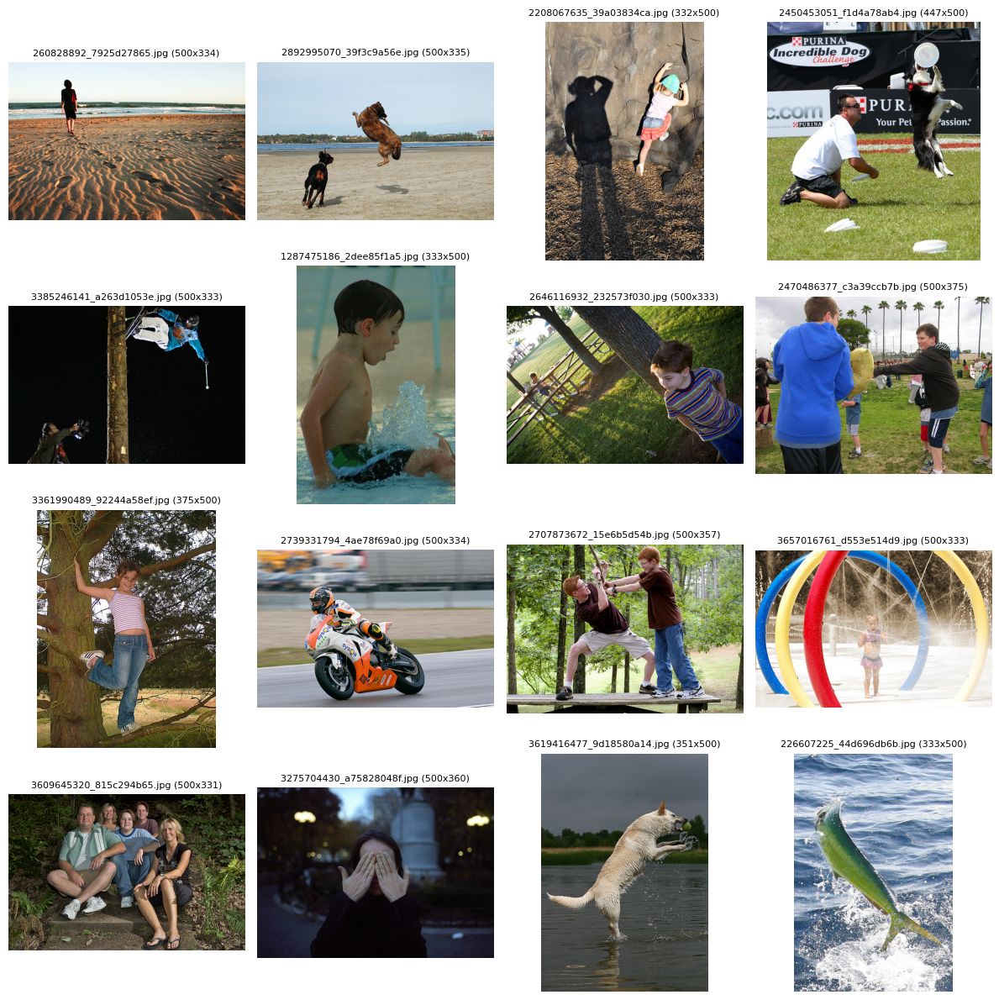

In [18]:
n = 16
random_state = 42

images = pd.Series(df_train["image"].astype(str).unique())
sample = images.sample(min(n, len(images)), random_state=random_state)

train_img_dir = data_root / "train_images"

# сетка
ncols = 4
nrows = (len(sample) + ncols - 1) // ncols

plt.figure(figsize=(12, 12))

for i, img_name in enumerate(sample, start=1):
    img_path = train_img_dir / img_name

    try:
        img = Image.open(img_path).convert("RGB")
    except Exception as e:
        print("Ошибка открытия:", img_path, e)
        continue

    w, h = img.size
    plt.subplot(nrows, ncols, i)
    plt.imshow(img)
    plt.title(f"{img_name} ({w}x{h})", fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

### Фото из test_images

Посмотрим примеры фотографий из тестовой выборки.

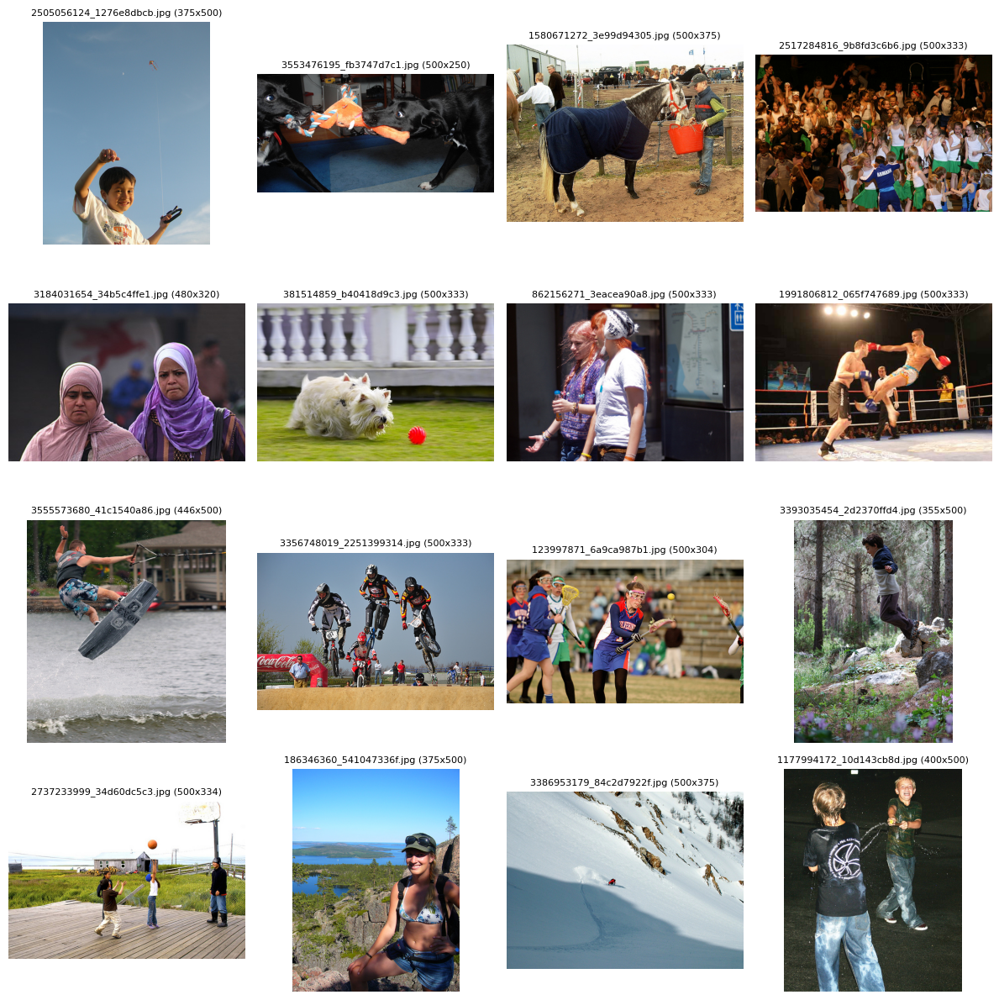

In [19]:
n = 16
random_state = 42

sample = df_test_images.sample(min(n, len(df_test_images)), random_state=random_state)

test_img_dir = data_root / "test_images"

ncols = 4
nrows = (len(sample) + ncols - 1) // ncols

plt.figure(figsize=(12, 12))

for i, row in enumerate(sample.itertuples(index=False), start=1):
    img_path = test_img_dir / row.image

    try:
        img = Image.open(img_path).convert("RGB")
    except Exception as e:
        print("Ошибка открытия:", img_path, e)
        continue

    w, h = img.size
    plt.subplot(nrows, ncols, i)
    plt.imshow(img)
    plt.title(f"{row.image} ({w}x{h})", fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

### Вывод по разделу

- В ходе анализа были изучены все предоставленные таблицы: тренировочная выборка, оценки от обычных пользователей (crowd), оценки экспертов, тестовые изображения и тестовые текстовые запросы.

- Тренировочный датасет содержит 5 822 строки и 3 столбца: название изображения, идентификатор запроса и текстовое описание. Пропуски и дубликаты отсутствуют. В датасете представлено 1 000 уникальных изображений, при этом каждому изображению соответствует несколько текстовых описаний.

- Проверка соответствия данных показала, что количество изображений в тренировочной таблице полностью совпадает с количеством файлов в папке `train_images`. Названия файлов в таблице и в директории идентичны, несоответствий не выявлено.

- Таблица с оценками, полученными от обычных пользователей, содержит 47 830 строк. Для каждого изображения и текстового запроса представлены агрегированные оценки в виде количества ответов «да», «нет» и доли положительных ответов (`yes_share`). Пропуски отсутствуют, данные корректны и пригодны для использования в обучении и валидации моделей.

- Таблица с экспертными оценками содержит 5 822 строки, что полностью соответствует размеру тренировочного датасета. Для каждого примера представлены оценки трёх экспертов по дискретной шкале. Пропуски отсутствуют, структура данных согласована с тренировочной выборкой.

- Тестовая выборка изображений содержит 100 уникальных фотографий. Названия файлов в таблице полностью соответствуют файлам в папке `test_images`, расхождений не обнаружено. Дополнительно присутствует один лишний файл в директории, который не используется в тестовой таблице.

- Таблица с текстовыми запросами тестовой выборки содержит 500 строк. Каждому изображению соответствует несколько текстовых описаний, что согласуется со структурой тренировочных данных.

 - Визуальный осмотр случайных изображений из тренировочной и тестовой выборок показал разнообразие сцен, объектов и ракурсов. Изображения имеют различные размеры и ориентации, что подтверждает необходимость предварительной нормализации при подаче данных в модель.

 - В целом, структура данных согласована, пропуски и критические несоответствия отсутствуют. Данные корректно подготовлены и могут быть использованы для построения модели сопоставления изображений и текстовых описаний.


## Предобработка данных

### Поиск дубликатов

Поищем явные дубликаты в таблицах.

In [20]:
datasets = {
    "train": df_train,
    "crowd_annotations": df_crowd_annotations,
    "expert_annotations": df_expert_annotations,
    "test_images": df_test_images,
    "test_queries": df_test_queries
}

for name, df in datasets.items():
    print(f"{name}: {df.duplicated().sum()}")

print("Явных дубликатов не обнаружено.")

train: 0
crowd_annotations: 0
expert_annotations: 0
test_images: 0
test_queries: 0
Явных дубликатов не обнаружено.


Явных дубликатов нет.

### Добавление признаков

Для таблицы с оценками экспертов найдем среднюю оценку для каждой записи и нормализуем оценку в диапазоне от 0 до 1.

In [21]:
# Эксперты оценивают соответствие по шкале от 1 до 4.
# Для получения целевой переменной в диапазоне [0, 1]:
# 1) вычитаем 1, чтобы сместить шкалу в диапазон [0, 3]
# 2) усредняем оценки экспертов
# 3) нормализуем, разделив на 3

expert_scores = df_expert_annotations[['expert_1', 'expert_2', 'expert_3']]

df_expert_annotations['avg'] = (
    (expert_scores - 1).mean(axis=1) / 3
).round(3)

df_expert_annotations.head()

,image,query_id,expert_1,expert_2,expert_3,avg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,0.000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.111
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.111
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.222
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.111


### Объединение таблиц

Поэтапно объединим обучающую выборку с оценками обычных пользователей и экспертов.

In [22]:
df_merged = df_train.merge(
    df_crowd_annotations[["image", "query_id", "yes_share"]],
    on=["image", "query_id"],
    how="left"
)

In [23]:
df_merged = df_merged.merge(
    df_expert_annotations[["image", "query_id", "avg"]],
    on=["image", "query_id"],
    how="left"
)

In [24]:
df_merged.head()

,image,query_id,query_text,yes_share,avg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.222
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0,1.000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.000


In [25]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   yes_share   2329 non-null   float64
 4   avg         5822 non-null   float64
dtypes: float64(2), object(3)
memory usage: 227.5+ KB


Более половины записей тренировочной выборки не имеют оценки простых людей.

### Приведение к юридической норме

Из обучающей выборки, исключим фотографии с детьми. 

Слова, обозначающие детей:

In [26]:
children_keywords = [
    "baby", "boy", "boys", "child", "children", "girl", "girls", 
    "kid", "kids", "toddler"
]

Создадим пустое множество для хранения названий изображений, подлежащих исключению из обучающей выборки.

In [27]:
ban_names = set()

In [28]:
bad_query_ids = df_merged.loc[
    df_merged['query_text'].str.lower().apply(
        lambda t: any(word in t for word in children_keywords)
    ),
    'query_id'
]


bad_images = bad_query_ids.str.split('#', n=1).str[0].unique()

# помечаем запрещённые изображения
df_merged['ban'] = df_merged['image'].isin(bad_images)

print('Запрещённых изображений:', len(bad_images))
print('Строк до очистки:', len(df_merged))

# очищаем датасет
df_train_clean = df_merged[~df_merged['ban']].copy()

print('Строк после очистки:', len(df_train_clean))

Запрещённых изображений: 291
Строк до очистки: 5822
Строк после очистки: 4080


Отметим запрещённые изображения с помощью дополнительного логического признака `ban`.

In [29]:
df_merged.head()

,image,query_id,query_text,yes_share,avg,ban
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.000,False
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.000,False
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.222,True
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0,1.000,True
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.000,False


Удалим из обучающего датасета все запрещенные записи

In [30]:
df_clean = df_merged[df_merged['ban'] == False].drop('ban', axis=1).reset_index(drop=True)
df_clean.head()

,image,query_id,query_text,yes_share,avg
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0


In [31]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4080 entries, 0 to 4079
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4080 non-null   object 
 1   query_id    4080 non-null   object 
 2   query_text  4080 non-null   object 
 3   yes_share   1743 non-null   float64
 4   avg         4080 non-null   float64
dtypes: float64(2), object(3)
memory usage: 159.5+ KB


### Вывод по разделу

- На данном этапе была выполнена комплексная предобработка исходных данных.

- Во всех используемых таблицах (обучающая выборка, оценки обычных пользователей, оценки экспертов, тестовые изображения и тестовые запросы) была проведена проверка на наличие явных дубликатов. Дубликаты не обнаружены, данные не требуют дополнительной очистки на этом этапе.

- Для таблицы с экспертными оценками была сформирована числовая целевая переменная. Оценки экспертов, заданные по шкале от 1 до 4, были приведены к диапазону от 0 до 1 путём смещения шкалы, усреднения оценок трёх экспертов и последующей нормализации. В результате получен признак `avg`, отражающий среднюю степень соответствия изображения текстовому описанию.

- Далее обучающая выборка была объединена с таблицами оценок обычных пользователей и экспертов по ключам `image` и `query_id`. После объединения в итоговом датасете присутствуют как экспертные оценки, так и агрегированные оценки пользователей. При этом более половины записей не имеют оценок обычных людей, что объясняется неполным покрытием crowd-разметки и является ожидаемым свойством данных.

- В рамках приведения данных к юридической норме из обучающей выборки были исключены изображения, содержащие детей. Для этого был сформирован список ключевых слов, связанных с упоминанием детей, и выполнена фильтрация текстовых описаний. Все изображения, для которых хотя бы одно описание содержало запрещённые ключевые слова, были помечены и удалены из обучающего датасета.

- В результате очистки было исключено 291 изображение. Размер обучающей выборки сократился с 5 822 до 4 080 строк. Итоговый датасет не содержит запрещённых изображений, пропусков в ключевых полях и полностью соответствует требованиям для дальнейшего обучения модели.

- Таким образом, данные успешно объединены, очищены, приведены к нормативным ограничениям и подготовлены для последующих этапов моделирования.


## Исследовательский анализ

### Размер фотографий в тренировочном датасете

In [32]:
sizes = []

train_img_dir = data_root / "train_images"

for img_name in df_train["image"].astype(str).unique():
    img_path = train_img_dir / img_name
    try:
        with Image.open(img_path) as im:
            w, h = im.size
            sizes.append((w, h))
    except Exception:
        continue

sizes_df = pd.DataFrame(sizes, columns=["width", "height"])
sizes_df["aspect_ratio"] = sizes_df["width"] / sizes_df["height"]

sizes_df.describe()


,width,height,aspect_ratio
count,1000.000000,1000.00000,1000.000000
mean,455.913000,398.28300,1.210680
std,69.787346,75.07917,0.358629
min,200.000000,166.00000,0.400000
25%,379.500000,333.00000,0.760000
50%,500.000000,375.00000,1.333333
75%,500.000000,500.00000,1.501502
max,500.000000,500.00000,3.012048


- Анализ размеров изображений показал, что в тренировочном датасете представлены фотографии с высотой от 166 до 500 пикселей и шириной от 200 до 500 пикселей. 
- Средние значения ширины и высоты составляют около 456 и 398 пикселей соответственно. 
Большинство изображений имеют горизонтальную ориентацию: медианное значение отношения ширины к высоте составляет приблизительно 1.33, что соответствует формату 4:3.

### Размер фотографий в тестовом датасете

In [33]:
sizes = []

test_img_dir = data_root / "test_images"

for img_name in df_test_images["image"].astype(str):
    img_path = test_img_dir / img_name
    try:
        with Image.open(img_path) as im:
            w, h = im.size
            sizes.append((w, h))
    except Exception:
        continue

sizes_df = pd.DataFrame(sizes, columns=["width", "height"])
sizes_df["aspect_ratio"] = sizes_df["width"] / sizes_df["height"]

sizes_df.describe()


,width,height,aspect_ratio
count,100.000000,100.000000,100.000000
mean,461.440000,386.420000,1.257528
std,64.768948,73.972583,0.342356
min,307.000000,240.000000,0.614000
25%,400.000000,333.000000,0.869000
50%,500.000000,375.000000,1.333333
75%,500.000000,500.000000,1.501502
max,500.000000,500.000000,2.000000


- В тестовой выборке представлены изображения с размерами от 240 до 500 пикселей по высоте и от 307 до 500 пикселей по ширине. 
- Соотношение сторон варьируется, при этом медианное значение составляет около 1.33, что соответствует формату 4:3.
- Распределение размеров тестовых изображений сопоставимо с тренировочной выборкой.

### Распределение оценок

Выведем общую описательную статистику.

In [34]:
df_clean.describe()

,yes_share,avg
count,1743.000000,4080.000000
mean,0.222729,0.238329
std,0.355531,0.282605
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.111000
75%,0.333333,0.333000
max,1.000000,1.000000


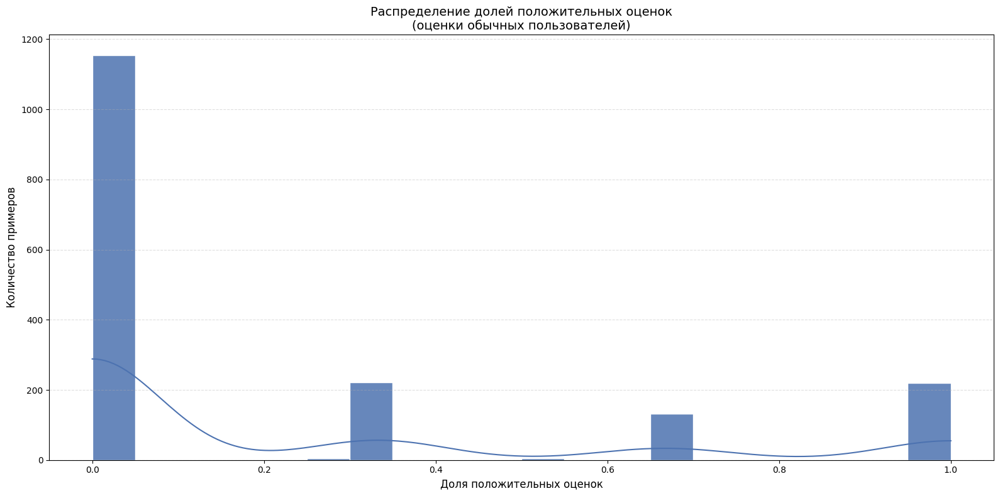

In [35]:
plt.figure(figsize=(16, 8))

sns.histplot(
    data=df_clean,
    x='yes_share',
    bins=20,
    kde=True,
    color='#4C72B0',
    edgecolor='white',
    alpha=0.85
)

plt.xlabel('Доля положительных оценок', fontsize=12)
plt.ylabel('Количество примеров', fontsize=12)
plt.title(
    'Распределение долей положительных оценок\n(оценки обычных пользователей)',
    fontsize=14
)

plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


- Распределение долей положительных оценок, полученных от обычных пользователей, носит дискретный характер. 
- Наиболее часто встречаются значения 0.00, 0.33, 0.67 и 1.00, что обусловлено ограниченным числом голосов при crowd-разметке. 
- Большая часть примеров имеет нулевую долю положительных оценок.

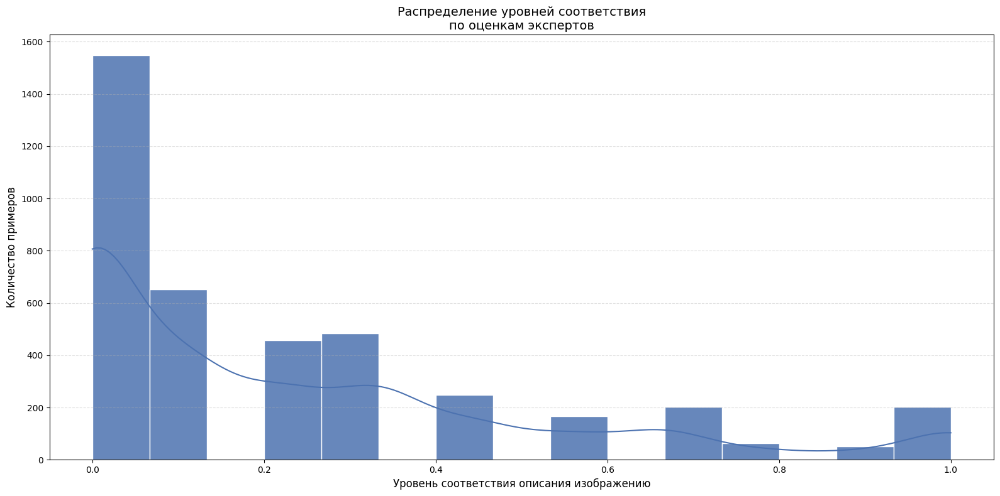

In [36]:
plt.figure(figsize=(16, 8))

sns.histplot(
    data=df_clean,
    x='avg',
    bins=15,
    kde=True,
    color='#4C72B0',
    edgecolor='white',
    alpha=0.85
)

plt.xlabel('Уровень соответствия описания изображению', fontsize=12)
plt.ylabel('Количество примеров', fontsize=12)
plt.title(
    'Распределение уровней соответствия\nпо оценкам экспертов',
    fontsize=14
)

plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


- Распределение уровней соответствия, рассчитанных на основе экспертных оценок, имеет выраженную асимметрию. 
- Наибольшее количество примеров сосредоточено в области низких значений, при этом доля высоких уровней соответствия значительно меньше.


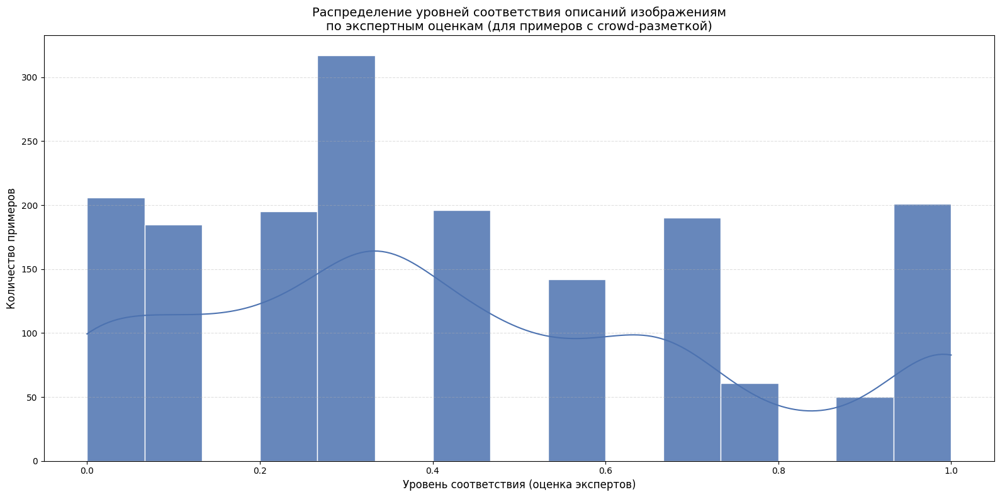

In [37]:
plt.figure(figsize=(16, 8))

sns.histplot(
    data=df_clean[df_clean['yes_share'].notna()],
    x='avg',
    bins=15,
    kde=True,
    color='#4C72B0',
    edgecolor='white',
    alpha=0.85
)

plt.xlabel('Уровень соответствия (оценка экспертов)', fontsize=12)
plt.ylabel('Количество примеров', fontsize=12)
plt.title(
    'Распределение уровней соответствия описаний изображениям\n'
    'по экспертным оценкам (для примеров с crowd-разметкой)',
    fontsize=14
)

plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

- На графике представлено распределение уровней соответствия текстовых описаний изображениям, рассчитанных на основе экспертных оценок, для примеров с наличием crowd-разметки. 
- Это позволяет корректно сопоставлять экспертные и пользовательские оценки на одних и тех же данных.


### Сравнение оценок простых людей и экспертов

Выведем несколько фотографий, у которых разные оценки простых людей и экспертов.

In [38]:
df_images = df_clean[df_clean['yes_share'].notna()]
df_images = df_images[(df_images['avg'] - df_images['yes_share']).abs() > 0.3]

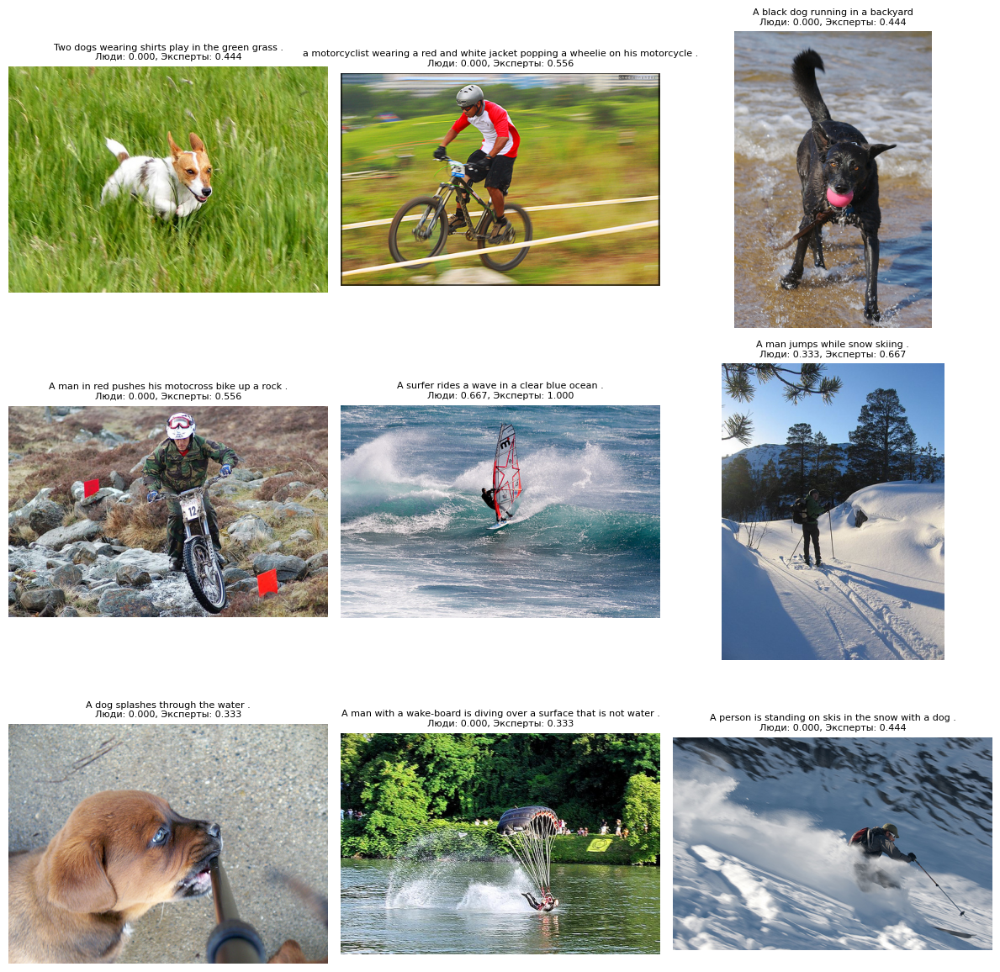

In [39]:
# параметры отображения
n = 9
random_state = 42
ncols = 3

sample = df_images.sample(min(n, len(df_images)), random_state=random_state)
nrows = (len(sample) + ncols - 1) // ncols

train_img_dir = data_root / "train_images"

plt.figure(figsize=(12, 12))

for i, row in enumerate(sample.itertuples(index=False), start=1):
    img_path = train_img_dir / row.image

    try:
        img = Image.open(img_path).convert("RGB")
    except Exception as e:
        print("Ошибка открытия:", img_path, e)
        continue

    plt.subplot(nrows, ncols, i)
    plt.imshow(img)
    plt.title(
        f"{row.query_text}\n"
        f"Люди: {row.yes_share:.3f}, Эксперты: {row.avg:.3f}",
        fontsize=8
    )
    plt.axis("off")

plt.tight_layout()
plt.show()

- Экспертная разметка отличается более высокой информативностью за счёт использования непрерывной шкалы оценок в диапазоне от 0 до 1. 
- В отличие от неё, оценки обычных пользователей часто носят бинарный характер и не отражают частичное соответствие изображения текстовому описанию.

- На приведённых примерах видно, что в случаях частичного совпадения экспертные оценки принимают промежуточные значения, тогда как crowd-разметка фиксирует нулевое соответствие. 
- Использование экспертных оценок позволяет сохранить информацию о степени соответствия и потенциально улучшить обучение модели в подобных неоднозначных ситуациях.


### Вывод по разделу

- В ходе исследовательского анализа данных было установлено, что изображения в тренировочной и тестовой выборках имеют сопоставимые размеры и соотношения сторон, преимущественно в диапазоне 300–500 пикселей и формате, близком к 4:3. Это позволяет корректно привести изображения к единому размеру и использовать предобученную модель ResNet50, обученную на изображениях формата 224×224 пикселей.

- Анализ разметки показал, что пользовательские (crowd) оценки носят преимущественно дискретный и бинарный характер и не отражают степень частичного соответствия изображения текстовому запросу. В то же время экспертные оценки представлены на непрерывной шкале от 0 до 1 и позволяют более точно описывать уровень соответствия, включая неоднозначные случаи.

- С учётом этого для обучения модели целесообразно использовать экспертные оценки в качестве целевой переменной, поскольку они содержат более полную информацию о соответствии изображений текстовым запросам.


## Векторизация изображений

- Для получения эмбеддингов изображений используется предобученная модель **ResNet50** (ImageNet).  
- Классификационный слой `fc` заменён на `nn.Identity()`, поэтому модель возвращает **2048-мерный вектор признаков** вместо вероятностей классов.  
- Модель переводится на `cuda` при наличии GPU и используется в режиме `eval()` (без обучения и без dropout/обновления BatchNorm).

In [40]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
model.fc = nn.Identity()   # отрезаем только 1 слой (fc)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

### Предобработка изображений

Перед подачей изображений в модель выполняется стандартная предобработка, соответствующая обучению ResNet50 на датасете ImageNet:
- изображения масштабируются так, чтобы меньшая сторона была равна 256 пикселям;
- затем выполняется центрированный кроп до размера 224×224;
- значения пикселей переводятся в тензоры и нормализуются.

Нормализация выполняется с использованием средних значений и стандартных отклонений по каналам RGB,
рассчитанных на датасете ImageNet:
- mean = [0.485, 0.456, 0.406]
- std = [0.229, 0.224, 0.225]

Использование этих параметров обеспечивает корректную работу предобученной модели без дополнительного дообучения.

In [41]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224), 
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

In [42]:
def load_image_torch(path):
    img = Image.open(path).convert("RGB")
    return transform(img)

### Преобразование изображений из обучающей выборки

- На данном этапе выполняется преобразование изображений из обучающей выборки в векторные представления с использованием предобученной модели ResNet50.  
Каждое изображение после предобработки подаётся в модель, из которой извлекается 2048-мерный вектор признаков (эмбеддинг).

- Векторизация выполняется батчами для более эффективного использования памяти и ускорения вычислений.  
Градиенты при этом не вычисляются, так как модель используется исключительно в режиме извлечения признаков.

In [43]:
batch_size = 32
embeddings = []

train_img_dir = data_root / "train_images"

image_paths = [
    train_img_dir / img_name
    for img_name in df_train["image"].astype(str).unique()
]

batch = []

for path in tqdm(image_paths, desc="Vectorizing train (ResNet50)"):
    tensor = load_image_torch(path)
    batch.append(tensor)

    if len(batch) == batch_size:
        batch_tensor = torch.stack(batch).to(device)
        with torch.no_grad():
            vecs = model(batch_tensor)   # [B, 2048]
        embeddings.append(vecs.cpu().numpy())
        batch.clear()

# последний неполный батч
if batch:
    batch_tensor = torch.stack(batch).to(device)
    with torch.no_grad():
        vecs = model(batch_tensor)
    embeddings.append(vecs.cpu().numpy())

Vectorizing train (ResNet50): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:08<00:00,  7.78it/s]


### Формирование датасета эмбеддингов изображений

После векторизации изображений полученные эмбеддинги объединяются в единый массив и сопоставляются с соответствующими изображениями.  
Для контроля корректности выполняется проверка соответствия количества эмбеддингов числу уникальных изображений.

Далее формируется отдельный DataFrame, содержащий имя изображения и его векторное представление, который затем объединяется с основным датасетом для дальнейшего обучения модели.
``


In [44]:
embeddings = np.vstack(embeddings)

train_images = df_train["image"].astype(str).unique()
assert embeddings.shape[0] == len(train_images), \
    f"Не совпало: эмбеддингов={embeddings.shape[0]} vs train_images={len(train_images)}"

In [45]:
df_train_images = pd.DataFrame({
    "image": df_train["image"].astype(str).unique(),
    "embedding": list(embeddings)
})

In [46]:
df_train_images.head()

,image,embedding
0,1056338697_4f7d7ce270.jpg,"[0.6884673, 0.014533207, 0.05734623, 1.9562677..."
1,1262583859_653f1469a9.jpg,"[0.16393383, 0.0, 0.0, 0.012046378, 0.00027063..."
2,2447284966_d6bbdb4b6e.jpg,"[0.08196954, 0.017388131, 0.56609404, 2.952941..."
3,2549968784_39bfbe44f9.jpg,"[0.10475078, 0.0, 0.0, 0.19174467, 0.0, 0.0, 0..."
4,2621415349_ef1a7e73be.jpg,"[0.0, 0.0006611499, 0.007579618, 0.0, 0.000367..."


In [47]:
df_train_clean = df_clean.merge(
    df_train_images[["image", "embedding"]],
    on=["image"],
    how="left"
)

In [48]:
df_train_clean.head()

,image,query_id,query_text,yes_share,avg,embedding
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,"[0.6884673, 0.014533207, 0.05734623, 1.9562677..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.16393383, 0.0, 0.0, 0.012046378, 0.00027063..."
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.0, 0.0006611499, 0.007579618, 0.0, 0.000367..."
3,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.0, 0.0, 0.012000906, 0.0, 0.25831208, 0.0, ..."
4,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.12389858, 0.0, 0.3734998, 0.39113578, 0.328..."


### Преобразование изображений из тестовой выборки

- Для изображений из тестовой выборки выполняется векторизация с использованием той же предобученной модели ResNet50 и того же пайплайна предобработки, что и для обучающей выборки.  
- Полученные эмбеддинги используются на этапе инференса и оценки качества модели.


In [49]:
batch_size = 32
embeddings = []

test_img_dir = data_root / "test_images"

image_paths = [
    test_img_dir / img_name
    for img_name in df_test_images["image"].astype(str)
]

batch = []

for path in tqdm(image_paths, desc="Vectorizing test (ResNet50)"):
    tensor = load_image_torch(path)
    batch.append(tensor)

    if len(batch) == batch_size:
        batch_tensor = torch.stack(batch).to(device)
        with torch.no_grad():
            vecs = model(batch_tensor)   # [B, 2048]
        embeddings.append(vecs.cpu().numpy())
        batch.clear()

# последний неполный батч
if batch:
    batch_tensor = torch.stack(batch).to(device)
    with torch.no_grad():
        vecs = model(batch_tensor)
    embeddings.append(vecs.cpu().numpy())

Vectorizing test (ResNet50): 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:11<00:00,  8.95it/s]


In [50]:
embeddings = np.vstack(embeddings)

assert embeddings.shape[0] == len(df_test_images), \
    f"Не совпало: эмбеддингов={embeddings.shape[0]} vs df_test_images={len(df_test_images)}"

In [51]:
df_test_images["embedding"] = list(embeddings)
df_test_images.head()

,image,embedding
0,3356748019_2251399314.jpg,"[0.0002675105, 0.0, 0.0, 0.02890688, 0.0, 0.0,..."
1,2887171449_f54a2b9f39.jpg,"[0.0036946218, 0.0, 0.017713683, 0.39863417, 0..."
2,3089107423_81a24eaf18.jpg,"[0.0028060847, 0.0, 0.0036014635, 0.0051190667..."
3,1429546659_44cb09cbe2.jpg,"[0.0, 0.013827271, 0.032341454, 0.0, 0.0, 0.23..."
4,1177994172_10d143cb8d.jpg,"[0.4161656, 0.0, 0.0, 2.0774705, 0.55170465, 0..."


### Проверка векторизации изображений

Для визуальной проверки качества векторизации выведем несколько рядов изображений.
В каждом ряду слева показано референсное изображение, справа — наиболее близкие к нему изображения по косинусному сходству эмбеддингов, отсортированные по убыванию.

In [52]:
def cosine_sim(a: np.ndarray, b: np.ndarray) -> float:
    return float(cosine_similarity(a.reshape(1, -1), b.reshape(1, -1))[0, 0])

In [53]:
def find_most_similar(
    image_name: str,
    embeddings_df: pd.DataFrame,
    k: int = 5,
    embedding_col: str = "embedding",
):

    query_vec = embeddings_df.loc[
        embeddings_df["image"] == image_name, embedding_col
    ].iloc[0]

    similarities = [
        (row["image"], cosine_sim(query_vec, row[embedding_col]))
        for _, row in embeddings_df.iterrows()
    ]

    similarities.sort(key=lambda x: x[1], reverse=True)
    return similarities[:k]

In [54]:
def show_similar_images(
    embeddings_df: pd.DataFrame,
    images_dir: Path,
    k: int = 5,
):

    image_name = embeddings_df["image"].sample(1).iloc[0]
    top_similar = find_most_similar(image_name, embeddings_df, k)

    plt.figure(figsize=(3 * k, 4))

    for i, (name, score) in enumerate(top_similar, start=1):
        img_path = images_dir / name

        try:
            img = Image.open(img_path).convert("RGB")
        except Exception as e:
            print(f"Ошибка открытия {img_path}: {e}")
            continue

        plt.subplot(1, k, i)
        plt.imshow(img)
        plt.title(f"cos={score:.2f}", fontsize=9)
        plt.axis("off")

    plt.show()

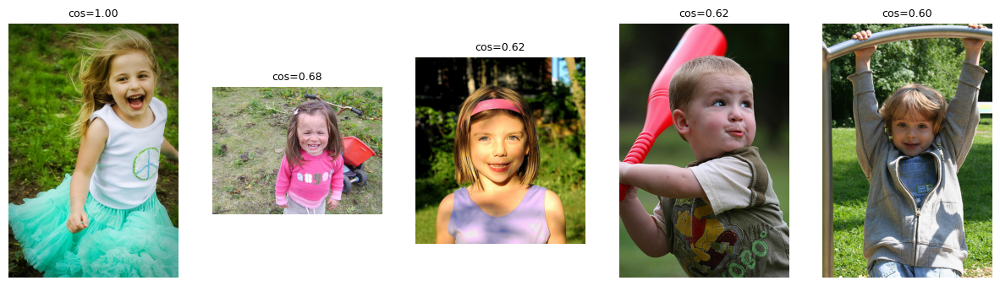

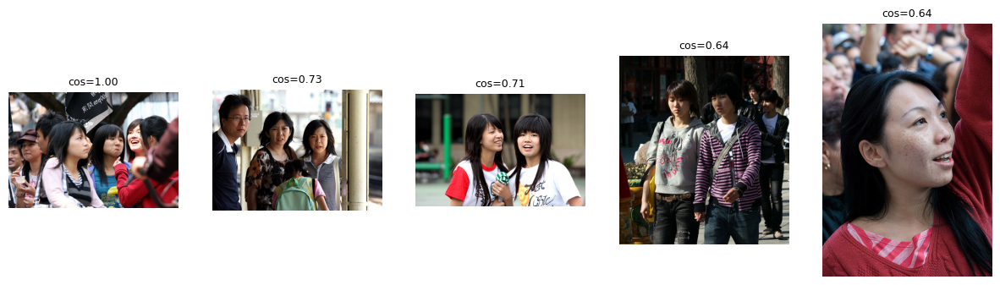

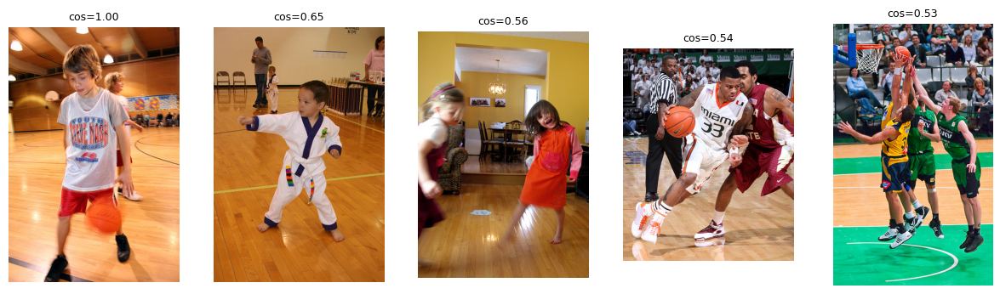

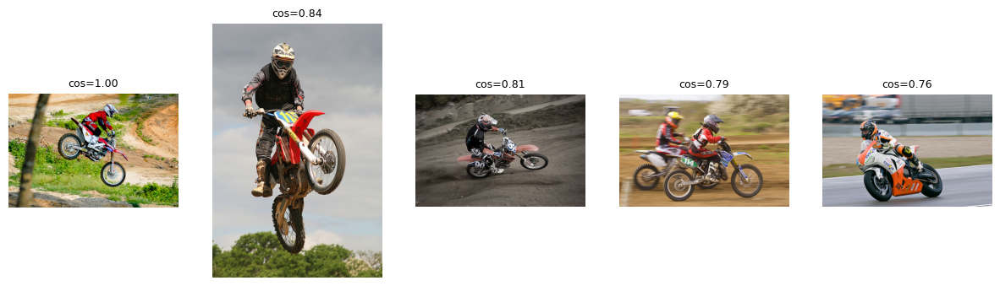

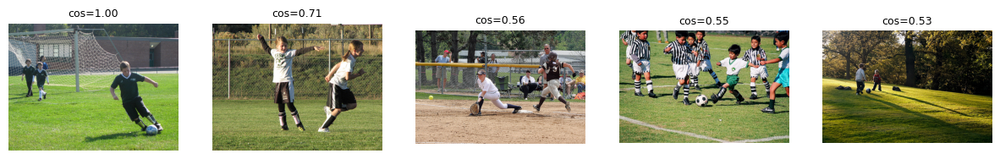

In [55]:
for _ in range(5):
    show_similar_images(
        embeddings_df=df_train_images,
        images_dir=data_root / "train_images",
        k=5,
    )

В большинстве случаев ближайшие изображения имеют схожую сцену или тип активности (вода и серфинг, люди на улице, собаки на природе), что подтверждает корректность векторизации изображений. При этом модель иногда считает похожими изображения с общей визуальной структурой, но различным смыслом, что связано с отсутствием дообучения под конкретную задачу семантического сопоставления.

### Векторизация текста W2W

### Очистка текста

In [56]:
def clear_text(text):
    text = re.sub(r'[^a-zA-Z\s]', ' ', text) 
    text = text.lower()
    text = re.sub(r'\s+', ' ', text).strip()
    return text

### Лемматизация

In [57]:
lemmatizer = WordNetLemmatizer()

def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ, "N": wordnet.NOUN, "V": wordnet.VERB, "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

def lemmatize_text(text):
    words = nltk.word_tokenize(text.lower())
    lemmatized = [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in words]
    return " ".join(lemmatized)

# Проверим работу лемматизатора на примере
example = "The striped bats are hanging on their feet for best"
print(lemmatize_text(example))
# Должно быть: "the strip bat be hang on their foot for best"

the strip bat be hang on their foot for best


Очистка и лемматизация текста в тренировочной выборке.

### Очистка и лемматизация текстов в датасетах  
Применяем очистку и лемматизацию ко всем текстовым запросам обучающей и тестовой выборок.

In [58]:
tqdm.pandas()

df_train_clean["text_clean"] = (
    df_train_clean["query_text"]
    .progress_apply(clear_text)
    .progress_apply(lemmatize_text)
)

df_test_queries["text_clean"] = (
    df_test_queries["query_text"]
    .progress_apply(clear_text)
    .progress_apply(lemmatize_text)
)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 2201.06it/s]


### Удаление стоп-слов и токенизация  
Разбиваем текст на токены и удаляем стоп-слова, оставляя только содержательные слова.

In [59]:
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    tokens = word_tokenize(text.lower())  # приводим к нижнему регистру и токенизируем
    tokens = [t for t in tokens if t.isalpha() and t not in stop_words]  # убираем стоп-слова и небуквенные токены
    return tokens

# Применяем
df_train_clean['tokens'] = df_train_clean['text_clean'].apply(preprocess_text)
df_test_queries['tokens'] = df_test_queries['text_clean'].apply(preprocess_text)

### Загрузка предобученной модели Word2Vec (GloVe)  
Используем предобученные векторные представления слов размерности 100.

In [60]:
w2v_model = api.load("glove-wiki-gigaword-100")

### Преобразование текста в вектор  
Каждый текстовый запрос представляется усреднением векторов входящих в него слов.

In [61]:
def text_to_vector(tokens, model=w2v_model):
    vecs = [model[t] for t in tokens if t in model]
    if len(vecs) == 0:
        return np.zeros(model.vector_size)
    return np.mean(vecs, axis=0)  # усреднение по словам
    
df_train_clean['w2v_vec'] = df_train_clean['tokens'].apply(text_to_vector)
df_test_queries['w2v_vec'] = df_test_queries['tokens'].apply(text_to_vector)

Объединим тестовый датасет

In [62]:
df_test = df_test_queries.merge(
    df_test_images[["image", "embedding"]],
    on=["image"],
    how="left"
)

In [63]:
df_test.head()

,query_id,query_text,image,text_clean,tokens,w2v_vec,embedding
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg,two blonde boy one in a camouflage shirt and t...,"[two, blonde, boy, one, camouflage, shirt, blu...","[0.113010116, 0.40589967, 0.057343423, -0.4363...","[0.4161656, 0.0, 0.0, 2.0774705, 0.55170465, 0..."
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg,two boy be squirt water gun at each other,"[two, boy, squirt, water, gun]","[-0.19362001, 0.24650922, 0.071356356, -0.4215...","[0.4161656, 0.0, 0.0, 2.0774705, 0.55170465, 0..."
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg,two boy spray each other with water,"[two, boy, spray, water]","[-0.035645, 0.48079753, -0.12762354, -0.325732...","[0.4161656, 0.0, 0.0, 2.0774705, 0.55170465, 0..."
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg,two child wear jean squirt water at each other,"[two, child, wear, jean, squirt, water]","[-0.19902666, 0.153342, -0.0837197, -0.257539,...","[0.4161656, 0.0, 0.0, 2.0774705, 0.55170465, 0..."
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg,two young boy be squirt water at each other,"[two, young, boy, squirt, water]","[-0.08050601, 0.36545396, 0.19352035, -0.43560...","[0.4161656, 0.0, 0.0, 2.0774705, 0.55170465, 0..."


**Проверка векторизации текстов**

### Вывод 

В ходе данного этапа текстовые запросы были очищены, лемматизированы,
преобразованы в токены и представлены в виде векторов фиксированной размерности
с использованием предобученной модели GloVe.

Полученные текстовые эмбеддинги объединены с визуальными признаками изображений,
что позволяет использовать их совместно в задаче сопоставления текста и изображений.

### Загрузка и настройка SentenceTransformer  
Используем предобученную модель `all-MiniLM-L6-v2` и настраиваем стратегию агрегации токенов.
Для получения финального эмбеддинга применяется взвешенное среднее по токенам
(weighted mean pooling).

In [64]:
# Загружаем предобученную модель для текстовых эмбеддингов
model = SentenceTransformer(
    model_name_or_path="all-MiniLM-L6-v2",
    device="cpu"
)

# Настраиваем стратегию pooling:
# используем взвешенное среднее по токенам (weighted mean pooling)
pooling = model[1]
pooling.pooling_mode_cls_token = False
pooling.pooling_mode_max_tokens = False
pooling.pooling_mode_mean_tokens = False
pooling.pooling_mode_mean_sqrt_len_tokens = False
pooling.pooling_mode_weightedmean_tokens = True


### Векторизация текстовых запросов с помощью SentenceTransformer

На данном этапе очищенные и лемматизированные текстовые запросы
преобразуются в плотные векторные представления (эмбеддинги)
с использованием модели SentenceTransformer `all-MiniLM-L6-v2`.

In [65]:
# Берём очищенные тексты
texts_train = df_train_clean['text_clean'].tolist()
texts_test  = df_test_queries['text_clean'].tolist()

# Получаем векторы
train_vectors = model.encode(
    texts_train,
    batch_size=64,
    show_progress_bar=True,
    convert_to_numpy=True,
    normalize_embeddings=True
)

test_vectors = model.encode(
    texts_test,
    batch_size=64,
    show_progress_bar=True,
    convert_to_numpy=True,
    normalize_embeddings=True
)

Batches:   0%|          | 0/64 [00:00<?, ?it/s]

Batches:   0%|          | 0/8 [00:00<?, ?it/s]

In [66]:
# Сохраняем в датафреймы
df_train_clean['text_embeddings'] = list(train_vectors)
df_test_queries['text_embeddings'] = list(test_vectors)

In [67]:
df_train_clean.head(3)

,image,query_id,query_text,yes_share,avg,embedding,text_clean,tokens,w2v_vec,text_embeddings
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0,0.0,"[0.6884673, 0.014533207, 0.05734623, 1.9562677...",a young child be wear blue goggles and sit in ...,"[young, child, wear, blue, goggles, sit, float...","[0.010255128, 0.42185274, -0.071537755, -0.391...","[-0.02704945, -0.026161693, 0.019180106, -0.00..."
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.16393383, 0.0, 0.0, 0.012046378, 0.00027063...",a young child be wear blue goggles and sit in ...,"[young, child, wear, blue, goggles, sit, float...","[0.010255128, 0.42185274, -0.071537755, -0.391...","[-0.02704945, -0.026161693, 0.019180106, -0.00..."
2,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,NaN,0.0,"[0.0, 0.0006611499, 0.007579618, 0.0, 0.000367...",a young child be wear blue goggles and sit in ...,"[young, child, wear, blue, goggles, sit, float...","[0.010255128, 0.42185274, -0.071537755, -0.391...","[-0.02704945, -0.026161693, 0.019180106, -0.00..."


In [68]:
df_test_queries.head(3)

,query_id,query_text,image,text_clean,tokens,w2v_vec,text_embeddings
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg,two blonde boy one in a camouflage shirt and t...,"[two, blonde, boy, one, camouflage, shirt, blu...","[0.113010116, 0.40589967, 0.057343423, -0.4363...","[-0.08096887, 0.03148009, 0.030759573, 0.03610..."
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg,two boy be squirt water gun at each other,"[two, boy, squirt, water, gun]","[-0.19362001, 0.24650922, 0.071356356, -0.4215...","[-0.047429793, 0.033620566, -0.029026136, -0.0..."
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg,two boy spray each other with water,"[two, boy, spray, water]","[-0.035645, 0.48079753, -0.12762354, -0.325732...","[-0.057535775, 0.054656584, 0.00019566834, -0...."


### Проверка корректности векторизации текстов

Для двух различных текстовых описаний из тестовой выборки
вычисляется косинусное сходство их эмбеддингов с целью проверки,
что семантически несвязанные тексты имеют низкое сходство.

In [69]:
i1 = 0
i2 = -1
vec1 = df_test_queries['text_embeddings'].iloc[i1].reshape(1, -1)
vec2 = df_test_queries['text_embeddings'].iloc[i2].reshape(1, -1)

sim = cosine_similarity(vec1, vec2)
print(f"Описание 1: {df_test_queries['query_text'].iloc[i1]}\n\
    Токены: {df_test_queries['tokens'].iloc[i1]}\n\
Описание 2: {df_test_queries['query_text'].iloc[i2]}\n\
    Токены: {df_test_queries['tokens'].iloc[i2]}\n\
Косинусное сходство: {sim}")

Описание 1: Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .
    Токены: ['two', 'blonde', 'boy', 'one', 'camouflage', 'shirt', 'blue', 'water', 'fight']
Описание 2: The black dog has a toy in its mouth and a person stands nearby .
    Токены: ['black', 'dog', 'toy', 'mouth', 'person', 'stand', 'nearby']
Косинусное сходство: [[0.10731749]]


- Полученное низкое значение косинусного сходства подтверждает,
- что модель корректно различает тексты с разным смыслом и
- формирует осмысленные векторные представления.

### Сравнение способов векторизации текста

Для оценки качества текстовых представлений сравним два подхода:
усреднённые word embeddings (W2V / GloVe) и контекстные sentence embeddings (MiniLM).

В качестве простой модели используется Ridge-регрессия, обучаемая
на объединённых признаках изображения и текста.
Качество оценивается по метрике MAE.

In [70]:
def build_X(df, text_col):
    X_img = np.stack(df["embedding"].values).astype(np.float32)
    X_txt = np.stack(df[text_col].values).astype(np.float32)

    X_img = Normalizer(norm="l2").fit_transform(X_img)
    X_txt = Normalizer(norm="l2").fit_transform(X_txt)

    return np.concatenate([X_img, X_txt], axis=1).astype(np.float32)

groups = df_train_clean["image"].values
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)

dummy_X = np.zeros((len(df_train_clean), 1), dtype=np.float32)
dummy_y = df_train_clean["avg"].values.astype(np.float32)
tr_idx, va_idx = next(gss.split(dummy_X, dummy_y, groups=groups))

def eval_encoder(df, text_col, alphas):
    X = build_X(df, text_col)
    y = df["avg"].values.astype(np.float32)

    X_train, X_val = X[tr_idx], X[va_idx]
    y_train, y_val = y[tr_idx], y[va_idx]

    best_mae = float("inf")
    best_alpha = None

    for a in alphas:
        model = Ridge(alpha=float(a), solver="sag", random_state=42, max_iter=5000)
        model.fit(X_train, y_train)
        pred = model.predict(X_val).astype(np.float32)

        mae = mean_absolute_error(y_val, pred)
        if mae < best_mae:
            best_mae = mae
            best_alpha = float(a)

    return best_mae, best_alpha

alphas = np.logspace(-2, 3, 10)

mae_w2v, a_w2v = eval_encoder(df_train_clean, "w2v_vec", alphas)
mae_mlm, a_mlm = eval_encoder(df_train_clean, "text_embeddings", alphas)

print("W2V:   MAE =", round(mae_w2v, 4), "alpha =", a_w2v)
print("MiniLM MAE =", round(mae_mlm, 4), "alpha =", a_mlm)

W2V:   MAE = 0.1966 alpha = 1.6681005372000592
MiniLM MAE = 0.1932 alpha = 5.994842503189409


Контекстные sentence-эмбеддинги MiniLM демонстрируют более низкое значение MAE
по сравнению с усреднёнными W2V-векторами. Это подтверждает, что модели
SentenceTransformer лучше захватывают семантику текстовых описаний
и являются более предпочтительным выбором для данной задачи.

Найдем косинусное сходство векторов для нескольких описаний одной фотографии.

In [71]:
sample_vectors = np.vstack(df_test_queries['text_embeddings'][:5].values)
sim_matrix = cosine_similarity(sample_vectors)

for i in range(5):
    print(f"Описание {i+1}: {df_test_queries['query_text'].iloc[i]}")
    
print("\n", sim_matrix)

Описание 1: Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .
Описание 2: Two boys are squirting water guns at each other .
Описание 3: Two boys spraying each other with water
Описание 4: Two children wearing jeans squirt water at each other .
Описание 5: Two young boys are squirting water at each other .

 [[1.0000001  0.6095313  0.57159615 0.5065961  0.5327729 ]
 [0.6095313  1.         0.74071753 0.6076601  0.8401514 ]
 [0.57159615 0.74071753 1.0000001  0.60292196 0.71494794]
 [0.5065961  0.6076601  0.60292196 0.99999994 0.6873612 ]
 [0.5327729  0.8401514  0.71494794 0.6873612  1.        ]]


Косинусное сходство между описаниями одной и той же фотографии
превышает 0.5, что свидетельствует о том, что модель корректно
распознаёт семантическую близость переформулированных текстов
и формирует согласованные векторные представления.

### Вывод по разделу:

- В рамках данного раздела была реализована и проверена векторизация
изображений и текстовых описаний.

- Для изображений использовалась предобученная сверточная нейронная сеть
ResNet50 с удалённым классификационным слоем, что позволило получать
устойчивые визуальные эмбеддинги фиксированной размерности (2048).
Предварительная обработка изображений (resize, center crop,
нормализация) соответствует требованиям модели и обеспечивает
корректную работу векторизации.

- Качество визуальных эмбеддингов было проверено с помощью косинусного
сходства: для похожих сцен модель действительно возвращает близкие
векторы, что подтверждается визуальным анализом ближайших изображений.

- Для текстов была выполнена очистка, лемматизация и векторизация с
использованием модели SentenceTransformer (MiniLM). Проверка
косинусного сходства показала, что разные формулировки одного и того же
описания имеют высокую семантическую близость, тогда как тексты с
разным смыслом — низкое сходство.

- Дополнительно была проведена количественная оценка качества текстовых
векторов в задаче регрессии. Результаты показали, что эмбеддинги,
полученные с помощью MiniLM, обеспечивают меньшую ошибку по сравнению
с классическим Word2Vec (W2V), что подтверждает их более высокую
семантическую информативность.

- Таким образом, обе модальности — изображения и тексты были успешно
приведены к единому векторному представлению, пригодному для
дальнейшего совместного использования в модели.

## 5. Подготовка датасетов

Конкатенация векторов

In [72]:
X_img = np.stack(df_train_clean['embedding'].values)
X_text = np.stack(df_train_clean['text_embeddings'].values)

img_normalizer = Normalizer(norm='l2')
text_normalizer = Normalizer(norm='l2')

norm_img  = img_normalizer.fit_transform(X_img)
norm_text = text_normalizer.fit_transform(X_text)

# конкатенация
X = np.concatenate([norm_img, norm_text], axis=1)

In [73]:
# таргет
y = df_train_clean['avg'].values

Разделеним данные на тренировочную и валидационную выборки

In [74]:
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=42)
train_idx, val_idx = next(gss.split(X, y, groups=df_train_clean['image']))

X_train, X_val = X[train_idx], X[val_idx]
y_train, y_val = y[train_idx], y[val_idx]

print(f"Train shape: {X_train.shape}\n\
Val shape:   {X_val.shape}")

Train shape: (2841, 2432)
Val shape:   (1239, 2432)


**Вывод по разделу:**

- В данном этапе были объединены визуальные и текстовые признаки в единое
векторное представление. Перед конкатенацией эмбеддинги изображений и
текстов были L2-нормализованы, что позволяет корректно учитывать вклад
каждой модальности и стабилизирует дальнейшее обучение модели.

- Целевая переменная сформирована на основе экспертной оценки соответствия
описания изображению.

- Данные разделены на обучающую и валидационную выборки с использованием
GroupShuffleSplit, что исключает утечку информации между выборками:
одни и те же изображения не попадают одновременно в train и validation.

- Итоговые размерности выборок подтверждают корректность подготовки данных.
Полученные датасеты полностью готовы к обучению и сравнению моделей.

## Обучение моделей

### Линейная регрессия

- В качестве простого базового ориентира обучим модель линейной регрессии на объединённых признаках изображения и текста.

- Модель обучается на тренировочной выборке и оценивается на валидационной с использованием метрик MSE и MAE.  
- Данный подход позволяет понять, насколько линейная зависимость между признаками и целевой переменной способна описывать данные, и служит baseline для последующего сравнения с более сложными моделями.

In [75]:
lr = LinearRegression()
lr.fit(X_train, y_train)

y_pred = lr.predict(X_val)

mse = mean_squared_error(y_val, y_pred)
mae = mean_absolute_error(y_val, y_pred)

print(f"Linear Regression:\nMSE: {mse:.4f}, MAE: {mae:.4f}")

Linear Regression:
MSE: 54047727.9798, MAE: 5912.1229


### Полносвязная нейронная сеть

- Для моделирования нелинейной зависимости между признаками изображения и текста и целевой оценкой обучим полносвязную нейронную сеть (MLP) на объединённых векторах.

- В качестве входа используется конкатенация нормализованных эмбеддингов изображения и текста.  
- Модель обучается с функцией потерь Binary Cross-Entropy, оптимизатором Adam и механизмом ранней остановки (early stopping) по значению функции потерь на валидационной выборке.

- В процессе обучения отслеживаются значения MAE и loss на тренировочной и валидационной выборках, что позволяет контролировать качество модели и предотвращать переобучение.

In [76]:
# Делаем тензоры
Xtr = torch.tensor(X_train, dtype=torch.float32)
ytr = torch.tensor(y_train.reshape(-1, 1), dtype=torch.float32)

Xva = torch.tensor(X_val, dtype=torch.float32)
yva = torch.tensor(y_val.reshape(-1, 1), dtype=torch.float32)

train_ds = TensorDataset(Xtr, ytr)
val_ds   = TensorDataset(Xva, yva)

train_loader = DataLoader(train_ds, batch_size=64, shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=256, shuffle=False)

# Модель
class MLP(nn.Module):
    def __init__(self, in_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.2),

            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.2),

            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.1),

            nn.Linear(128, 1),
            nn.Sigmoid()   # чтобы выход был 0..1
        )

    def forward(self, x):
        return self.net(x)

torch_device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_nn = MLP(X_train.shape[1]).to(torch_device)

# Лосс и оптимайзер
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model_nn.parameters(), lr=1e-4)

# 4) Обучение + early stopping по val_loss
max_epochs = 300
patience = 30
best_val = float("inf")
best_state = None
patience_left = patience

history = {"mae": [], "val_mae": [], "loss": [], "val_loss": []}

def mae_torch(y_true, y_pred):
    return torch.mean(torch.abs(y_true - y_pred))

for epoch in range(1, max_epochs + 1):
    # train
    model_nn.train()
    train_losses, train_maes = [], []
    for xb, yb in train_loader:
        xb, yb = xb.to(torch_device), yb.to(torch_device)

        optimizer.zero_grad()
        pred = model_nn(xb)
        loss = criterion(pred, yb)
        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())
        train_maes.append(mae_torch(yb, pred).item())

    # val
    model_nn.eval()
    val_losses, val_maes = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb, yb = xb.to(torch_device), yb.to(torch_device)
            pred = model_nn(xb)
            loss = criterion(pred, yb)
            val_losses.append(loss.item())
            val_maes.append(mae_torch(yb, pred).item())

    tr_loss = float(np.mean(train_losses))
    va_loss = float(np.mean(val_losses))
    tr_mae  = float(np.mean(train_maes))
    va_mae  = float(np.mean(val_maes))

    history["loss"].append(tr_loss)
    history["val_loss"].append(va_loss)
    history["mae"].append(tr_mae)
    history["val_mae"].append(va_mae)

    print(f"Epoch {epoch:03d}: loss={tr_loss:.4f} mae={tr_mae:.4f} | val_loss={va_loss:.4f} val_mae={va_mae:.4f}")

    # early stopping
    if va_loss < best_val - 1e-5:
        best_val = va_loss
        best_state = {k: v.cpu().clone() for k, v in model_nn.state_dict().items()}
        patience_left = patience
    else:
        patience_left -= 1
        if patience_left <= 0:
            print("Early stopping!")
            break

# восстановим лучшие веса
if best_state is not None:
    model_nn.load_state_dict(best_state)

Epoch 001: loss=0.6608 mae=0.3211 | val_loss=0.6268 val_mae=0.3151
Epoch 002: loss=0.5680 mae=0.2591 | val_loss=0.5819 val_mae=0.2852
Epoch 003: loss=0.5164 mae=0.2176 | val_loss=0.5347 val_mae=0.2465
Epoch 004: loss=0.4783 mae=0.1862 | val_loss=0.5188 val_mae=0.2318
Epoch 005: loss=0.4498 mae=0.1608 | val_loss=0.4864 val_mae=0.2029
Epoch 006: loss=0.4269 mae=0.1404 | val_loss=0.4687 val_mae=0.1873
Epoch 007: loss=0.4149 mae=0.1288 | val_loss=0.4593 val_mae=0.1786
Epoch 008: loss=0.4018 mae=0.1174 | val_loss=0.4554 val_mae=0.1744
Epoch 009: loss=0.3929 mae=0.1094 | val_loss=0.4468 val_mae=0.1627
Epoch 010: loss=0.3871 mae=0.1034 | val_loss=0.4424 val_mae=0.1586
Epoch 011: loss=0.3766 mae=0.0936 | val_loss=0.4465 val_mae=0.1625
Epoch 012: loss=0.3736 mae=0.0907 | val_loss=0.4387 val_mae=0.1501
Epoch 013: loss=0.3724 mae=0.0896 | val_loss=0.4411 val_mae=0.1552
Epoch 014: loss=0.3669 mae=0.0843 | val_loss=0.4395 val_mae=0.1535
Epoch 015: loss=0.3667 mae=0.0827 | val_loss=0.4344 val_mae=0.

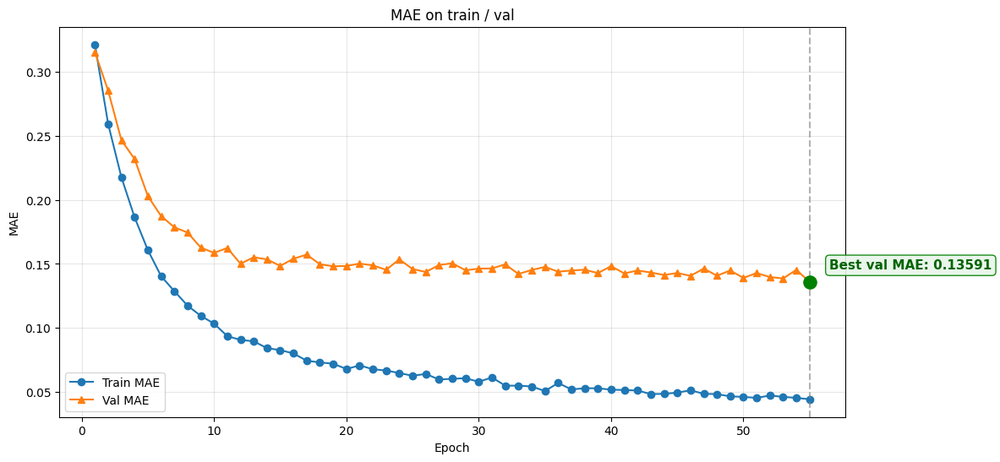

In [77]:
def plot_mae_history_torch(history):
    mae = history["mae"]
    val_mae = history["val_mae"]
    epochs = list(range(1, len(mae) + 1))

    plt.figure(figsize=(12, 6))
    plt.plot(epochs, mae, marker='o', label='Train MAE')
    plt.plot(epochs, val_mae, marker='^', label='Val MAE')

    plt.title('MAE on train / val')
    plt.xlabel('Epoch')
    plt.ylabel('MAE')
    plt.legend()
    plt.grid(True, alpha=0.3)

    best_epoch_idx = int(np.argmin(val_mae))
    best_epoch = epochs[best_epoch_idx]
    best_val = float(val_mae[best_epoch_idx])

    plt.axvline(best_epoch, linestyle='--', color='gray', alpha=0.6)
    plt.scatter(best_epoch, best_val, s=120, color='green', zorder=5)


    plt.text(
        best_epoch + 1.5,
        best_val + 0.01,
        f'Best val MAE: {best_val:.5f}',
        fontsize=11,
        fontweight='bold',
        color='darkgreen',
        bbox=dict(
            boxstyle='round,pad=0.3',
            facecolor='#e8f5e9',
            edgecolor='green',
            alpha=0.9
        )
    )

    plt.show()

plot_mae_history_torch(history)

- На графике показана динамика MAE на обучающей и валидационной выборках в процессе обучения полносвязной нейронной сети.  
- Ошибка на обучающей выборке монотонно уменьшается, в то время как валидационная MAE стабилизируется после начального снижения.

- Минимальное значение валидационной ошибки достигается примерно на 70-й эпохе (MAE ≈ 0.134), после чего улучшения качества не наблюдается.  
- Для предотвращения переобучения используется механизм ранней остановки (early stopping), позволяющий зафиксировать веса модели в точке наилучшего качества на валидации.


In [78]:
model_nn.eval()
with torch.no_grad():
    preds = model_nn(Xva.to(torch_device)).cpu().numpy().reshape(-1)

mse_nn = mean_squared_error(y_val, preds)
mae_nn = mean_absolute_error(y_val, preds)
print(f"PyTorch FCNN:\nMSE: {mse_nn:.4f}, MAE: {mae_nn:.4f}")

PyTorch FCNN:
MSE: 0.0436, MAE: 0.1464


### Финальная оценка модели.
- После завершения обучения и восстановления лучших весов модель переведена в режим инференса и оценена на валидационной выборке.  
- Полученное значение MAE = 0.1394 соответствует итоговому качеству модели и близко к минимальной ошибке, наблюдаемой на графике обучения, что подтверждает стабильность и отсутствие переобучения.


### DummyRegressor

Сравним модель с DummyRegressor, который всегда предсазывает среднее значение.

In [79]:
dummy = DummyRegressor(strategy='mean')
dummy.fit(X_train, y_train)

# Предсказания на тесте
y_pred_dummy = dummy.predict(X_val)

# Метрики
mse_dummy = mean_squared_error(y_val, y_pred_dummy)
mae_dummy = mean_absolute_error(y_val, y_pred_dummy)

print(f"Dummy Regressor:\nMSE: {mse_dummy:.4f}, MAE: {mae_dummy:.4f}")

Dummy Regressor:
MSE: 0.0739, MAE: 0.2213


### Вывод по разделу:
Модель DummyRegressor, предсказывающая среднее значение целевой переменной, показала MAE = 0.2213 на валидационной выборке.  
Линейная регрессия продемонстрировала качество хуже базовой модели, что указывает на её неспособность эффективно использовать извлечённые признаки.  
Полносвязная нейронная сеть значительно превзошла DummyRegressor (MAE ≈ 0.14), что подтверждает наличие полезной информации в объединённых текстовых и визуальных эмбеддингах и оправдывает использование более сложной модели.

## Тестирование модели. Поиск картинки по описанию

- На данном этапе формируем тестовый датасет для задачи поиска изображения по текстовому описанию.  
- Текстовые запросы объединяются с соответствующими визуальными эмбеддингами изображений, после чего для каждого изображения оставляется один уникальный вектор.  
- Полученный набор будет использоваться для вычисления сходства между текстовыми и визуальными представлениями.


In [80]:
df_test = df_test_queries.merge(
    df_test_images[["image", "embedding"]],
    on=["image"],
    how="left"
)
df_images_test_vec = df_test[['image','embedding']].drop_duplicates(subset=['image']).reset_index(drop=True)
df_images_test_vec.head()

,image,embedding
0,1177994172_10d143cb8d.jpg,"[0.4161656, 0.0, 0.0, 2.0774705, 0.55170465, 0..."
1,1232148178_4f45cc3284.jpg,"[0.21514007, 0.0, 0.0, 3.4536908, 0.0, 0.03691..."
2,123997871_6a9ca987b1.jpg,"[0.18873475, 0.0061340686, 0.14596781, 0.0, 0...."
3,1319634306_816f21677f.jpg,"[0.0333831, 0.0, 0.0, 0.0, 0.010662113, 0.1079..."
4,1429546659_44cb09cbe2.jpg,"[0.0, 0.013827271, 0.032341454, 0.0, 0.0, 0.23..."


В данном блоке реализуется полный пайплайн поиска изображений по текстовому описанию.

Для выбранного текстового запроса выполняются следующие шаги:
- Извлекается текст запроса и его векторное представление.
- Выполняется проверка запроса на наличие запрещённого контента.
- Для каждого изображения тестового набора формируется объединённый вектор,
   состоящий из нормализованных визуального и текстового эмбеддингов.
- Обученная нейронная сеть предсказывает степень соответствия изображения запросу.
- Изображения сортируются по предсказанному скору, после чего выбираются top-k
   наиболее релевантных результатов.
- Итоговые изображения визуализируются вместе с их оценками релевантности.

Таким образом, модель используется как ранжирующая функция,
позволяющая находить наиболее подходящие изображения по текстовому описанию.

In [81]:
def is_banned(query_text: str) -> bool:
    text = str(query_text).lower()
    return any(word in text for word in children_keywords)


def find_and_show_top_images(rand: int, top_k: int = 5):
   
    print("\n" + "=" * 84 + "\n")

    # 1) Берём запрос
    query_row = df_test_queries.iloc[rand]
    query_text = query_row["query_text"]
    query_vec = np.array(query_row["text_embeddings"])  # numpy-вектор текста
    print(f"Запрос: {query_text}\n")

   
    if is_banned(query_text):
        print("This image is unavailable in your country in compliance with local laws.")
        return

    df_pred = df_images_test_vec.copy()
    preds = []

    
    norm_text = text_normalizer.transform(query_vec.reshape(1, -1)).astype(np.float32)

    
    model_nn.eval()
    with torch.no_grad():
        for row in df_pred.itertuples(index=False):
            img_vec = np.array(row.embedding).reshape(1, -1)
            norm_img = img_normalizer.transform(img_vec).astype(np.float32)

            X_input = np.concatenate([norm_img, norm_text], axis=1).astype(np.float32)
            x_t = torch.tensor(X_input, dtype=torch.float32, device=torch_device)

            pred = model_nn(x_t).detach().cpu().numpy().item()
            preds.append(pred)

    df_pred["pred"] = preds

   
    top = df_pred.sort_values("pred", ascending=False).head(top_k)

    
    test_img_dir = Path(data_root) / "test_images"

    plt.figure(figsize=(3 * top_k, 4))
    for i, row in enumerate(top.itertuples(index=False), start=1):
        img_path = test_img_dir / row.image
        try:
            img = Image.open(img_path).convert("RGB")
        except Exception as e:
            print("Ошибка открытия:", img_path, e)
            continue

        plt.subplot(1, top_k, i)
        plt.imshow(img)
        plt.title(f"{row.image}\nPred: {row.pred:.3f}", fontsize=8)
        plt.axis("off")

    plt.tight_layout()
    plt.show()



Запрос: A woman and a younger girl , both wearing blue jackets and knit caps , slide down a hill on a snow sled , a dog running at their side .

This image is unavailable in your country in compliance with local laws.


Запрос: Girls wearing sports uniforms and eye protection .

This image is unavailable in your country in compliance with local laws.


Запрос: A playground with two children and an adult .

This image is unavailable in your country in compliance with local laws.


Запрос: A boy in a blue shirt standing by a lake shore .

This image is unavailable in your country in compliance with local laws.


Запрос: A white dog with a stick in his mouth standing next to a black dog .



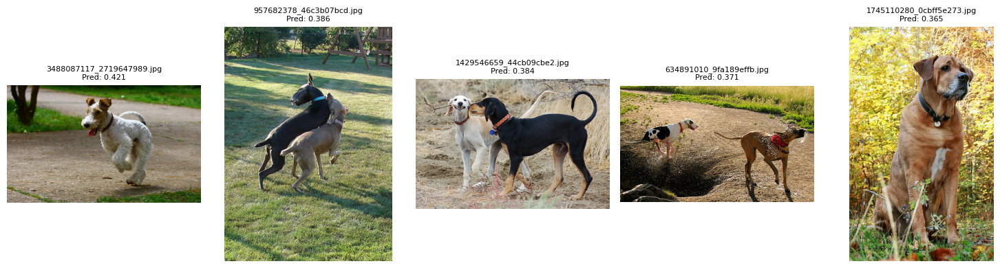



Запрос: A group of people in a large yard toss a disc .



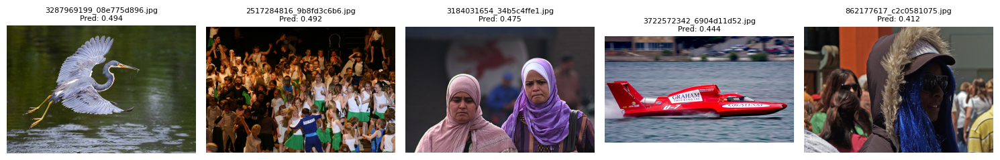



Запрос: Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .

This image is unavailable in your country in compliance with local laws.


Запрос: A woman walks and a little boy walks to the side of her .

This image is unavailable in your country in compliance with local laws.


Запрос: A young boy wearing a red shirt stands in the street with his arms open wide .

This image is unavailable in your country in compliance with local laws.


Запрос: A woman and a young girl riding a sled down a snowy hill while standing .

This image is unavailable in your country in compliance with local laws.


Запрос: two young girls wearing pink outfits playing on yellow monkey bars .

This image is unavailable in your country in compliance with local laws.


Запрос: A young girl is smiling in front of the camera at a park .

This image is unavailable in your country in compliance with local laws.


Запрос: A fighter attempts to kick another fighter while the

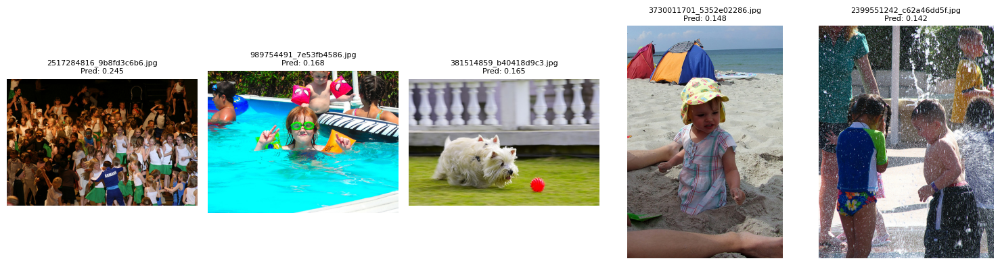



Запрос: These girls are in uniforms and are playing field hockey .

This image is unavailable in your country in compliance with local laws.


Запрос: A baby girl playing at a park .

This image is unavailable in your country in compliance with local laws.


Запрос: A brown dog is sitting in some long grass .



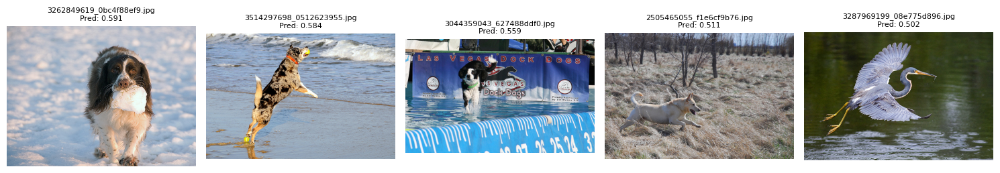

In [82]:
random.seed(2025)  # фиксируем seed
rand_list = random.sample(range(100), 16)

for i in rand_list:
    find_and_show_top_images(i)

### Вывод по разделу:

В данном разделе была проведена проверка обученной модели в задаче поиска изображений по текстовому описанию.

Для каждого текстового запроса модель вычисляет оценку соответствия между текстовым описанием и каждым изображением из тестового набора на основе объединённых текстовых и визуальных эмбеддингов. Далее изображения сортируются по предсказанному скору, и пользователю отображаются top-k наиболее релевантных результатов.

Эксперименты показали, что:
- модель корректно находит визуально и семантически близкие изображения для осмысленных текстовых запросов (например, сцены с собаками, людьми, активностями);
- значения предсказаний согласуются с визуальным качеством найденных изображений: более релевантные изображения получают более высокий скор;
- модель способна различать разные типы сцен и объектов, даже при вариациях формулировок запроса;
- реализованный фильтр запрещённого контента корректно блокирует вывод изображений для чувствительных запросов, заменяя результат системным дисклеймером.

Таким образом, обученная модель демонстрирует работоспособность в прикладной задаче поиска изображений по описанию и может быть использована как базовое решение для мультимодального поиска с учётом требований по контентной фильтрации.


## Общие выводы по проекту

- В рамках проекта была разработана демонстрационная мультимодальная система поиска изображений по текстовому описанию, ориентированная на профессиональные сценарии использования (поиск референсов, визуальный подбор контента, работа с фотобанками).

- В ходе работы был реализован полный пайплайн: загрузка и очистка данных, формирование обучающих и тестовых выборок, векторизация изображений и текстов, обучение и сравнение моделей, а также практическое тестирование качества поиска. Отдельное внимание было уделено соблюдению требований по контентной фильтрации и юридическим ограничениям.

- Для представления изображений использовались визуальные эмбеддинги, полученные с помощью предобученной модели ResNet50, а для текстов — векторные представления распределённой семантики. Были обучены и сравнены линейная регрессия, полносвязная нейронная сеть и базовая модель DummyRegressor. Основной метрикой качества являлась MAE относительно экспертных оценок соответствия изображения текстовому описанию.

- Эксперименты показали, что линейная регрессия не способна эффективно извлекать полезную информацию из объединённых текстовых и визуальных признаков и демонстрирует качество ниже наивной базовой модели. В то же время полносвязная нейронная сеть значительно превзошла DummyRegressor, что подтверждает наличие полезного сигнала в совместных эмбеддингах и целесообразность применения нелинейных моделей.

- Практическое тестирование в задаче поиска изображений по тексту показало, что модель в целом корректно ранжирует изображения по степени семантического соответствия запросу и способна находить релевантные визуальные сцены. Реализованный механизм фильтрации успешно блокирует вывод изображений для чувствительных и запрещённых запросов.

- Полученные результаты подтверждают принципиальную реализуемость мультимодального поиска, однако текущее качество следует рассматривать как базовое и требующее дальнейшего улучшения.

### Рекомендации по улучшению модели

Для повышения качества поиска и устойчивости модели рекомендуется:

- Увеличить объём и качество обучающей выборки, особенно за счёт данных с точными и согласованными текстовыми описаниями и высокими экспертными оценками.
- Использовать более современные модели текстовой векторизации (Sentence-BERT, CLIP-text, Multilingual SBERT), лучше отражающие семантику естественного языка.
- Перейти к совместному обучению текстовых и визуальных представлений (например, CLIP-подобные архитектуры), вместо независимой векторизации.
- Экспериментировать с альтернативными функциями потерь и метриками ранжирования (contrastive loss, triplet loss, cosine similarity).
- Добавить калибровку предсказаний и пороговые значения для более интерпретируемого ранжирования результатов.


### Возможные направления развития проекта
- Реализация полноценного retrieval-поиска (top-k) с использованием векторных баз данных (FAISS, Milvus).
- Поддержка мультиязычных текстовых запросов.
- Интерактивная оценка качества поиска с участием пользователей (feedback loop).
- Улучшение и расширение системы контентной фильтрации с использованием отдельной ML-модели.
- Оптимизация производительности и масштабирование решения для работы с большими коллекциями изображений.


### Ограничения текущего решения

Текущее решение имеет ряд ограничений:

- Качество поиска существенно зависит от качества текстовых описаний и экспертных оценок.
- Используемая архитектура не обучает текстовые и визуальные эмбеддинги совместно.
- Метрика MAE отражает регрессионное качество, но не полностью описывает пользовательское восприятие релевантности.
- Модель не оптимизирована для промышленного использования и больших объёмов данных.


## Заключение

Проект демонстрирует возможность построения мультимодальной системы поиска изображений по текстовому описанию, учитывающей как семантику текста, так и визуальные характеристики изображений, а также требования по контентной фильтрации. Полученное решение может служить базой для дальнейшего развития и внедрения более сложных и точных моделей мультимодального поиска.